In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

In [3]:
master_data = pd.read_csv('../Resources/master_data.csv')

In [4]:
warnings.filterwarnings("ignore")

In [5]:
master_data.head()

,Unnamed: 0,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,manufacturer,made_in,price_group
0,0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,Maruti,India,"400,000 - 600,000"
1,1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,Skoda,Europe,"200,000 - 400,000"
2,2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,Honda,Asia,"20,000 - 200,000"
3,3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,Hyundai,Asia,"200,000 - 400,000"
4,4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,Maruti,India,"20,000 - 200,000"


<AxesSubplot:xlabel='km_driven', ylabel='selling_price'>

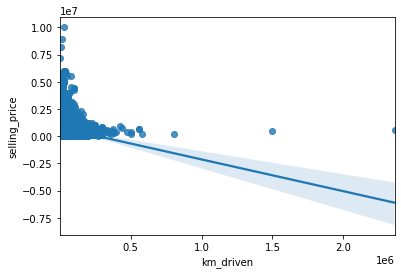

In [6]:
# selling price vs km driven
dat = master_data[(master_data['selling_price']<35_00_000) & (master_data['km_driven']<10_00_000)]

sns.regplot(data = master_data, x='km_driven', y='selling_price')

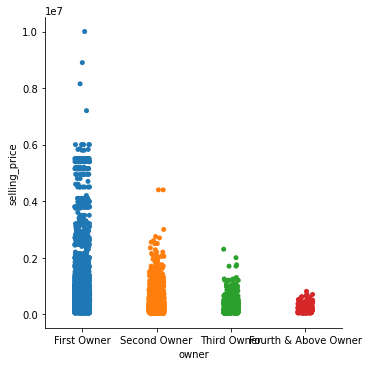

<Figure size 1080x720 with 0 Axes>

In [7]:
# selling price vs owner
sns.catplot(data = master_data, x='owner', y='selling_price')
plt.figure(figsize=(15,10))
plt.show()

<AxesSubplot:title={'center':'Sold By'}, ylabel='owner'>

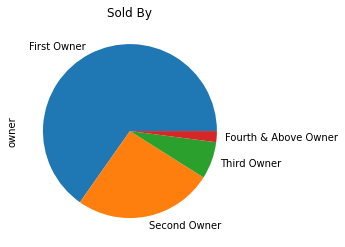

In [8]:
master_data["owner"].value_counts().plot(kind='pie', title= "Sold By")

<AxesSubplot:xlabel='year', ylabel='selling_price'>

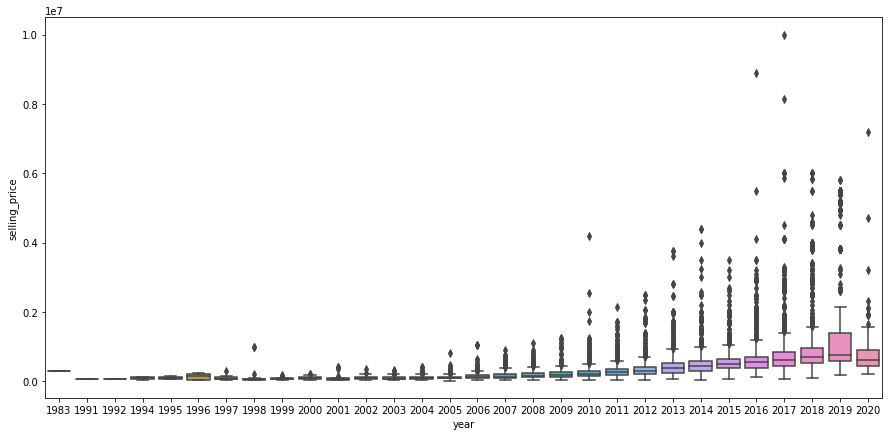

In [93]:
# year vs selling_price
plt.figure(figsize=(15,7))
sns.boxplot(data = master_data, x='year', y='selling_price')

<AxesSubplot:title={'center':'Year Manufactured'}, ylabel='year'>

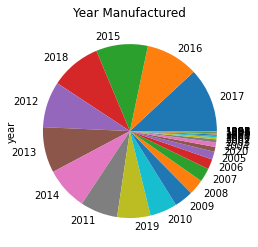

In [135]:
master_data["year"].value_counts().plot(kind='pie', title= "Year Manufactured")

In [137]:
master_data["year"].describe()

count    12446.000000
mean      2013.545396
std          4.114628
min       1983.000000
25%       2011.000000
50%       2014.000000
75%       2017.000000
max       2020.000000
Name: year, dtype: float64

<AxesSubplot:title={'center':'Fuel Type'}, ylabel='fuel'>

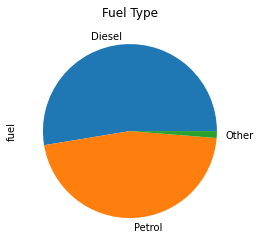

In [136]:
master_data["fuel"].value_counts().plot(kind='pie', title= "Fuel Type")

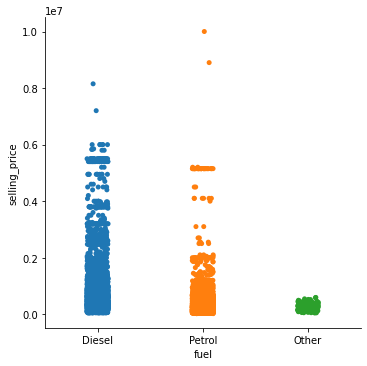

<Figure size 1080x720 with 0 Axes>

In [94]:
# selling price vs owner
sns.catplot(data = master_data, x='fuel', y='selling_price')
plt.figure(figsize=(15,10))
plt.show()

Text(0.5, 1.0, 'Petrol')

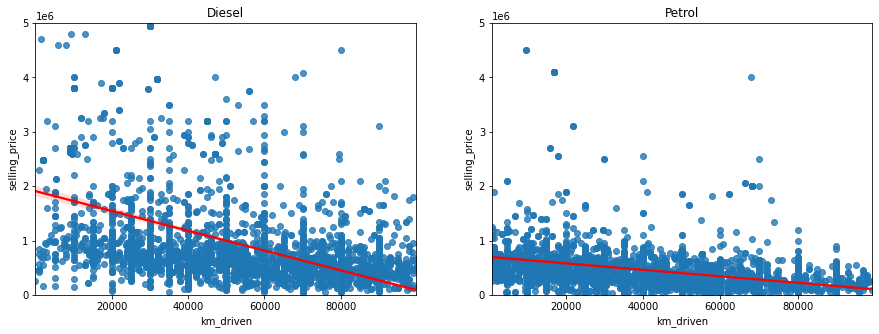

In [128]:
# Selling price by km driven, diesel
diesel = master_data[master_data["fuel"] == "Diesel"]
petrol = master_data[master_data["fuel"] == "Petrol"]

fig, ax =plt.subplots(1,2, figsize=(15,5))
ax[0].set_ylim(0, 5000000)
sns.regplot(diesel[diesel["km_driven"] < 100000]["km_driven"] , diesel[diesel["km_driven"] < 100000]["selling_price"], line_kws={'color':'red'}, ax=ax[0]).set_title("Diesel")
ax[1].set_ylim(0, 5000000)
sns.regplot(petrol[petrol["km_driven"] < 100000]["km_driven"] , petrol[petrol["km_driven"] < 100000]["selling_price"], line_kws={'color':'red'}, ax=ax[1]).set_title("Petrol")

Conclusion: Kilometers driven is more influential on the price of Diesel cars than Petrol cars.

Text(0.5, 1.0, 'Petrol')

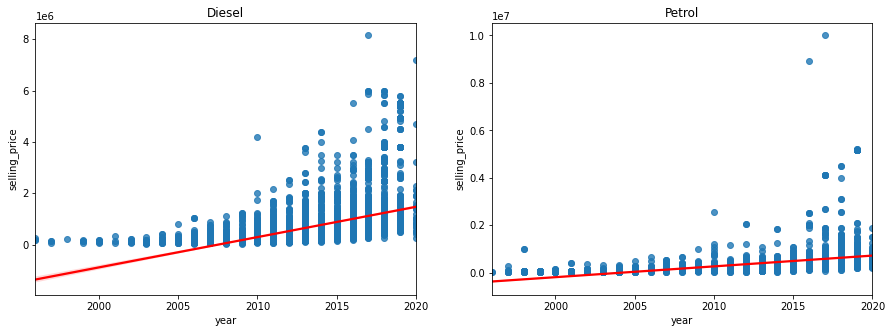

In [97]:
# Selling price by km driven, diesel
fig, ax =plt.subplots(1,2, figsize=(15,5))
diesel = master_data[master_data["fuel"] == "Diesel"]
sns.regplot(diesel[diesel["year"] > 1995]["year"] , diesel[diesel["year"] > 1995]["selling_price"], line_kws={'color':'red'}, ax=ax[0]).set_title("Diesel")

petrol = master_data[master_data["fuel"] == "Petrol"]
sns.regplot(petrol[petrol["year"] > 1995]["year"] , petrol[petrol["year"] > 1995]["selling_price"], line_kws={'color':'red'}, ax=ax[1]).set_title("Petrol")

Conclusion: Having a recent manufacturing year is more influential on the selling price of Diesel-fuel cars than Petrol-fuel cars.

<AxesSubplot:xlabel='transmission', ylabel='selling_price'>

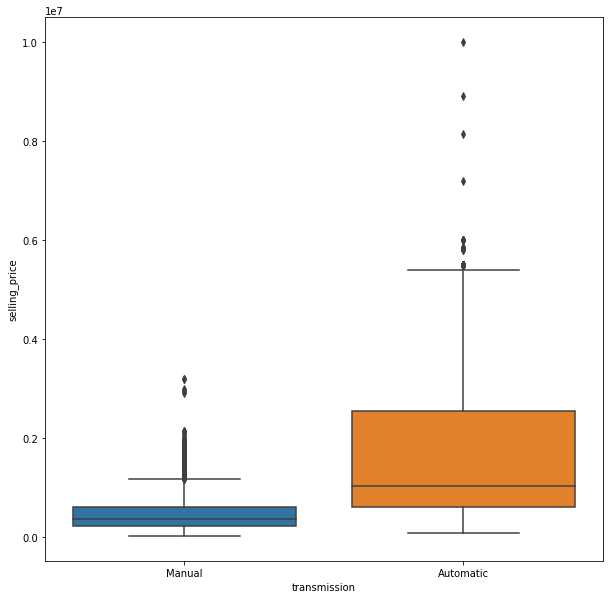

In [98]:
# transmission vs selling_price
plt.figure(figsize=(10,10))
sns.boxplot(data = master_data, x='transmission', y='selling_price')

<AxesSubplot:xlabel='fuel', ylabel='selling_price'>

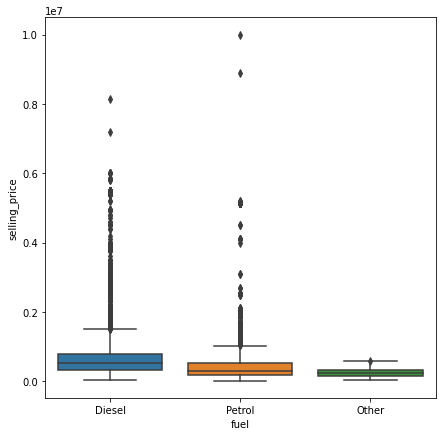

In [99]:
# seller_type vs selling_price
plt.figure(figsize=(7,7))
sns.boxplot(data = master_data, x='fuel', y='selling_price')

In [100]:
master_data["selling_price"].describe()

count    1.244600e+04
mean     5.895504e+05
std      7.329144e+05
min      2.000000e+04
25%      2.400000e+05
50%      4.160000e+05
75%      6.500000e+05
max      1.000000e+07
Name: selling_price, dtype: float64

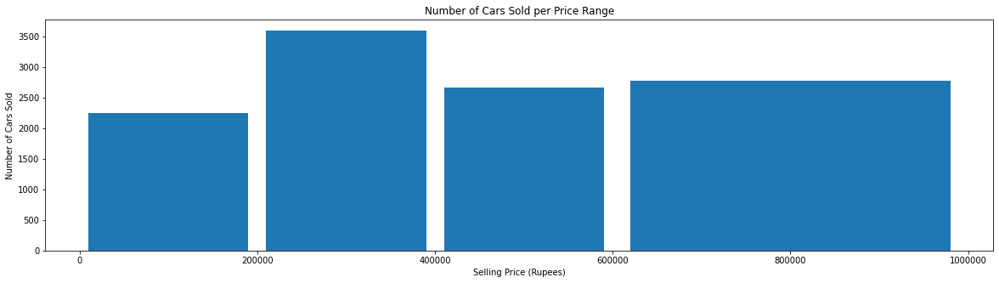

In [101]:
plt.figure(figsize=(20,5))

price_bins = [0, 200000, 400000, 600000, 1000000]

# Visualize distribution of selling price grouped by bucket
plt.hist(master_data["selling_price"], bins=price_bins, rwidth=.9)
plt.title("Number of Cars Sold per Price Range")
plt.xlabel("Selling Price (Rupees)")
plt.ylabel("Number of Cars Sold")
plt.ticklabel_format(style='plain')